# Part 9: Analysis of Tgd cells

In this document, we focus on Tgd and unconventional cell cluster subsetted from the main CD8 dataset. To recapitulate the analysis, please download the Tgd Seurat object available at Zenodo: [https://doi.org/10.5281/zenodo.14222418](https://doi.org/10.5281/zenodo.14222418)

In [7]:
ls()

[1] "annotate_tcell_data"          "cd8_l1_full_filt"            
 [3] "convertHumanGeneList"         "create_df4"                  
 [5] "create_df4_counts"            "gd"                          
 [7] "get_df_all4_for_tcr_analysis" "get_gene_pct_expression"     
 [9] "ggtheme"                      "is_positive"                 
[11] "plot_overlap_index"           "plot_plot1"                  
[13] "plot_plot2"                   "plot_plot3"                  
[15] "plot_plot5"                   "plot_plot6"                  
[17] "plot_plot7"                   "plot_plot8"                  
[19] "plot_tcr_overlap_matrix"      "process_dataset"             
[21] "process_plots_from_dataset"   "rank_score_func"             
[23] "save_dimplot_plot"            "tcr_overlap_heatmap"         
[25] "tcr_overlap_heatmap_patient"

In [1]:
.libPaths("~/R/x86_64-pc-linux-gnu-library/4.4/")
library(GEOquery)
source("diabetes_analysis_v07.R")

Loading required package: Biobase

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, table,
    tapply, union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.


Setting options('download.file.method.GEOquery'='auto')

Setting options('GEOquery.inmemory.gpl'=FALSE)

Loading required package: SummarizedExperiment


Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend



Attaching package: ‘fs’


The following object is masked from ‘package:BiocGenerics’:

    path


Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Attaching shinyBS

rgeos version: 0.6-4, (SVN revision 699)
 GEOS runtime version: 3.12.1-CAPI-1.18.1 
 Please note that rgeos will be retired during October 2023,
plan transition to sf or terra functions using GEOS at your earliest convenience.
See https://r-spatial.org/r/2023/05/15/evolution4.html for details.
 GEOS using OverlayNG
 Linking to sp version: 2.1-2 
 Polygon checking: TRUE 


ggtree v3.12.0 For help: https://yulab-smu.top/treedata-book/

If you use the ggtree package suite in published research, please cite
the appropriate paper(s):

Guangchuang Yu, David Smith, Huachen Zhu, Yi Guan, Tommy Tsan-Yuk Lam.
ggtree: an R package for visualization and annotation of phylogene

In [2]:
plan("multisession")

# Load data

In [12]:
## CD8 All
cd8_l1_full_filt  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L1/cd8_l1_full_filt.rds")

In [13]:
cd8_l1_full_filt

An object of class Seurat 
32114 features across 95229 samples within 10 assays 
Active assay: integrated (1000 features, 1000 variable features)
 2 layers present: data, scale.data
 9 other assays present: RNA, Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3, pathwayswmean, CollecTRI
 2 dimensional reductions calculated: pca, umap

In [14]:
## CD8 Tgd
gd  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L2/cd8_l2_unc.rds")

# DE gd vs CD8 Naive


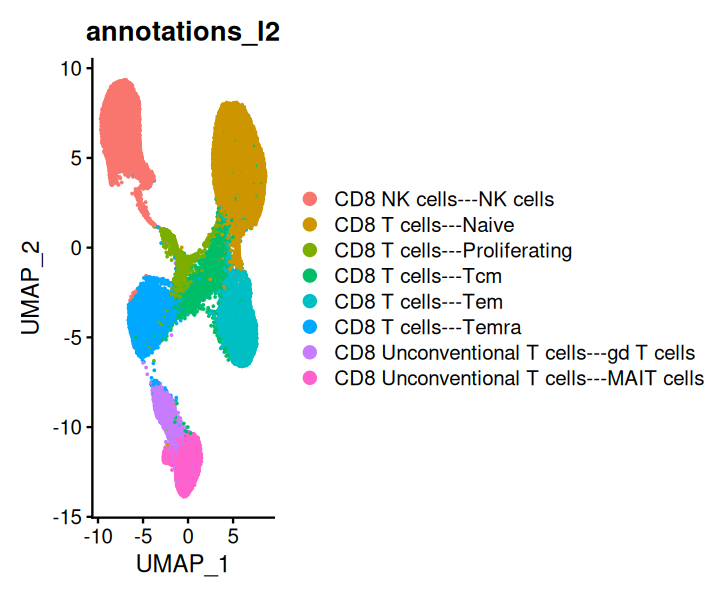

In [6]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(cd8_l1_full_filt, group.by = "annotations_l2")

In [7]:
Idents(cd8_l1_full_filt)  <- cd8_l1_full_filt$annotations_l2

In [8]:
table(cd8_l1_full_filt$annotations_l2)


                CD8 NK cells---NK cells                     CD8 T cells---Naive 
                                  21149                                   25869 
            CD8 T cells---Proliferating                       CD8 T cells---Tcm 
                                   2006                                    6427 
                      CD8 T cells---Tem                     CD8 T cells---Temra 
                                  13657                                   15109 
CD8 Unconventional T cells---gd T cells CD8 Unconventional T cells---MAIT cells 
                                   3766                                    7246 

In [9]:
mrk  <- FindMarkers(cd8_l1_full_filt,
                   `ident.1` = "CD8 Unconventional T cells---gd T cells",
                   `ident.2` = "CD8 T cells---Naive")

In [10]:
DefaultAssay(cd8_l1_full_filt)  <- "RNA"

In [11]:
fc  <- FoldChange(cd8_l1_full_filt,
                   `ident.1` = "CD8 Unconventional T cells---gd T cells",
                   `ident.2` = "CD8 T cells---Naive")

In [12]:
fc  <- fc  %>% arrange(avg_log2FC)  %>% rownames_to_column("gene")

In [14]:
treg_gene_sig  <- c('S100A4', 'FOXP3', 'ITGB1', 'AHNAK', 'TIGIT', 'ANXA2', 'IL10RA', 
                    'TNFRSF1B', 'GBP5', 'LGALS1', 'RTKN2', 'CTLA4', 'S100A10', 'IL32', 
                    'FCRL3', 'IL2RA', 'CLIC1', 'KLF6', 'ANXA5', 'SYNE2', 'S100A11', 
                    'CD74', 'CRIP1', 'EZR', 'NIBAN1', 'FLNA', 'NCF4', 'PRDM1', 'LGALS3', 
                    'CAPN2', 'ARID5B', 'SH3BGRL3', 'CST7', 'ISG20', 'MYO1F', 'LMNA', 
                    'HLA-DRB5', 'TENT5C', 'GAPDH', 'MTHFD2', 'FANK1', 'HLA-DQA1', 
                    'IL2RB', 'IKZF2', 'SRGN', 'STAM', 'CLDND1', 'DUSP4', 'BIRC3', 
                    'SAT1', 'PBXIP1', 'HLA-DRB1', 'HLA-DPA1', 'TNFRSF4', 'SHMT2', 
                    'TAGLN2', 'PLP2', 'ACTN4', 'DUSP1', 'RORA', 'CD99', 'GLCCI1', 
                    'CARD16', 'PTTG1', 'TSPAN5', 'TAP1', 'OPTN', 'EIF3A', 'ELOVL5', 
                    'LSR', 'GSTK1', 'ZFP36', 'TIFA', 'BATF', 'EMP3', 'TSC22D3', 'OGDH', 
                    'HLA-DPB1', 'CCDC50', 'LIMS1', 'RAB11FIP1', 'TRAC', 'CD84', 'CAST', 
                    'PYHIN1', 'JPT1', 'MPST', 'SAMSN1', 'ZC2HC1A', 'PMAIP1', 'S100A6', 
                    'PI16', 'OAS1', 'PPP1R18', 'NCR3', 'CD58', 'DOK2', 'BCL2L11', 
                    'SMAD3', 'GBP2', 'SYT11', 'PPP2R5C', 'PPP1R15A', 'RGS1', 'RAB37', 
                    'REEP5', 'IKZF3', 'RNF214', 'IRF1', 'ANTKMT', 'PRDX1', 'IQGAP2', 'MT2A', 
                    'TNFRSF18', 'FAS', 'DUSP2', 'CCDC167', 'HLA-DRA', 'PELI1', 'JUNB', 'LGALS9', 
                    'ZBTB38', 'SPTAN1', 'SMS', 'PARP1', 'MCL1', 'DYNLL1', 'HERC5', 'CDC25B', 
                    'SLC9A3R1', 'MYO1G', 'TPR', 'JUN', 'ID3', 'TPI1', 'RILPL2', 'CCR6', 
                    'YWHAH', 'PTGER2', 'HNRNPLL', 'PREX1', 'PSMB9', 'MYH9', 'CORO1B', 'SLAMF1', 
                    'SIT1', 'NPDC1', 'PHACTR2', 'ST8SIA6', 'ATP2B4', 'IL18R1', 'TRIM22', 'HLA-DQB1', 
                    'F5', 'TBC1D4', 'MAF', 'ATP2B1', 'C4orf48', 'GALM', 'C12orf75', 'CPA5', 
                    'PPP1CA', 'S1PR4', 'PDE4DIP', 'GATA3', 'GLIPR2', 'CHST7', 'CXCR4', 'H1-4', 
                    'GADD45B', 'RESF1', 'IER2', 'ISG15', 'CDC42EP3', 'PCBD1', 'LYST', 'TPM4', 
                    'TAB2', 'NINJ2', 'ALOX5AP', 'CCR4', 'FCER1G', 'MAP3K1', 'CXCR3', 'CD59', 
                    'SLFN5', 'CCNG2', 'ITGA4', 'SESN1', 'SPATS2L', 'HPGD', 'EFHD2', 'LIMA1', 
                    'BCL2', 'RABGAP1L', 'TOX', 'SAMD9', 'TXN', 'IFI16', 'IDS', 'TRIB2', 'CDHR3', 
                    'PALM2AKAP2', 'ICA1', 'LPAR6', 'KLRB1', 'SMC6', 'ITM2C', 'CEACAM4', 'PRF1', 
                    'CD63', 'AHR', 'IQGAP1', 'GADD45A', 'ADAM8', 'GLIPR1', 'VAV3', 'EPSTI1', 
                    'GPRIN3', 'POU2F2', 'SH2D2A', 'DENND10', 'MAP4', 'CCR10', 'PTPN18', 'IER5', 
                    'GPR183', 'LAIR2', 'CTSC', 'TTN', 'NR4A2', 'SESN3', 'CPNE2', 'MX1')


In [15]:
fc.df  <- fc  %>%   dplyr::select(gene, avg_log2FC)
ranks<- deframe(fc.df)

In [16]:
library(fgsea)

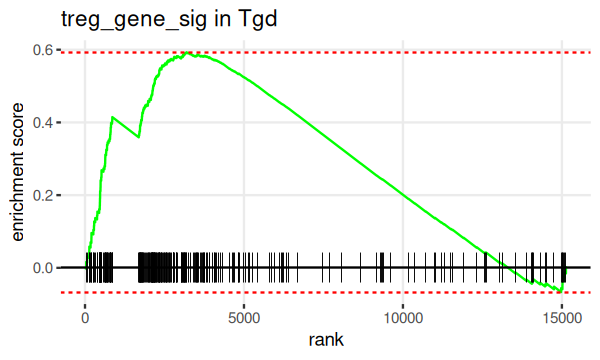

In [17]:
options(repr.plot.width = 5, repr.plot.height = 3)

plotEnrichment(treg_gene_sig,
               ranks) + labs(title="treg_gene_sig in Tgd") 


In [18]:
fg  <- fgsea(pathways = list("treg_gene_sig" = treg_gene_sig),
               ranks)

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (5.43% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


In [19]:
fg$leadingEdge

[[1]]
  [1] "CST7"       "KLRB1"      "PRDM1"      "ST8SIA6"    "NIBAN1"    
  [6] "MAF"        "FCRL3"      "MYO1F"      "MPST"       "CCR6"      
 [11] "HLA-DRA"    "HLA-DRB1"   "LAIR2"      "IL18R1"     "CD58"      
 [16] "TENT5C"     "PRF1"       "ANXA2"      "HLA-DRB5"   "EFHD2"     
 [21] "PYHIN1"     "DUSP4"      "TNFRSF18"   "LGALS3"     "SPATS2L"   
 [26] "ADAM8"      "AHNAK"      "CCDC50"     "NCF4"       "ACTN4"     
 [31] "DUSP2"      "HLA-DQB1"   "CHST7"      "TNFRSF1B"   "ATP2B4"    
 [36] "SMAD3"      "TIGIT"      "S100A11"    "PHACTR2"    "FAS"       
 [41] "SLAMF1"     "NCR3"       "PMAIP1"     "LGALS1"     "HLA-DPA1"  
 [46] "S100A4"     "NPDC1"      "LMNA"       "VAV3"       "SYT11"     
 [51] "TNFRSF4"    "SRGN"       "CLIC1"      "SYNE2"      "IL2RB"     
 [56] "DOK2"       "GBP5"       "SH2D2A"     "ANXA5"      "C12orf75"  
 [61] "HLA-DQA1"   "NINJ2"      "CD99"       "IL2RA"      "ITGB1"     
 [66] "GLIPR1"     "RAB11FIP1"  "GPRIN3"     "GLIPR2"     "CTSC"      
 [71] "GALM"       "CD63"       "GPR183"     "PPP2R5C"    "HNRNPLL"   
 [76] "ALOX5AP"    "RTKN2"      "PREX1"      "RORA"       "HLA-DPB1"  
 [81] "KLF6"       "CRIP1"      "PALM2AKAP2" "TPM4"       "PTGER2"    
 [86] "CCR4"       "OPTN"       "CAPN2"      "FLNA"       "IQGAP2"    
 [91] "CDC42EP3"   "LIMS1"      "CAST"       "ARID5B"     "HPGD"      
 [96] "CXCR3"      "IRF1"       "GLCCI1"     "IER5"       "TSPAN5"    
[101] "HERC5"      "OAS1"       "REEP5"      "CD74"       "IQGAP1"    
[106] "YWHAH"      "MYO1G"      "IL32"       "H1-4"       "LPAR6"     
[111] "SLC9A3R1"   "IL10RA"     "ZFP36"      "CTLA4"      "CCDC167"   
[116] "NR4A2"      "PTPN18"     "CLDND1"     "CPNE2"      "CARD16"    
[121] "IFI16"      "SH3BGRL3"   "BATF"       "TRAC"       "IDS"       
[126] "GADD45A"    "TXN"        "TOX"        "CD59"       "EMP3"      
[131] "EZR"        "MAP4"       "RABGAP1L"   "PCBD1"      "LYST"      
[136] "CCR10"      "OGDH"       "DUSP1"      "PPP1R18"    "S100A6"

In [20]:
cd8_l1_full_filt  <- AddModuleScore(cd8_l1_full_filt, features = treg_gene_sig,
                                   search = F,
  ctrl = 50,
  nbin = 50,
  assay = "RNA",
  name = 'treg_gene_sig')

In [21]:
cd8_l1_full_filt$treg_gene_sig1

AAACCTGAGATATGCA-1_1_1_1_1_1 AAACCTGAGGTGACCA-1_1_1_1_1_1 
                6.064498e-01                 1.904323e+00 
AAACCTGAGTACGATA-1_1_1_1_1_1 AAACCTGAGTCGCCGT-1_1_1_1_1_1 
               -1.843116e+00                 1.381148e+00 
AAACCTGCATCGTCGG-1_1_1_1_1_1 AAACCTGGTATTCGTG-1_1_1_1_1_1 
               -1.419774e+00                 1.003043e+00 
AAACCTGGTTCGAATC-1_1_1_1_1_1 AAACCTGTCCGGCACA-1_1_1_1_1_1 
                4.000790e-01                -3.813439e-01 
AAACCTGTCTGAAAGA-1_1_1_1_1_1 AAACGGGAGAATGTTG-1_1_1_1_1_1 
                6.585818e-01                -1.787181e+00 
AAACGGGAGTGACTCT-1_1_1_1_1_1 AAACGGGCAGCGTTCG-1_1_1_1_1_1 
               -1.668345e+00                 1.253001e+00 
AAACGGGGTTGGTTTG-1_1_1_1_1_1 AAACGGGTCCACTCCA-1_1_1_1_1_1 
               -1.612183e+00                 1.849717e+00 
AAACGGGTCCTTGACC-1_1_1_1_1_1 AAAGATGAGACAAGCC-1_1_1_1_1_1 
                1.666073e+00                 2.455358e+00 
AAAGATGAGATGTGTA-1_1_1_1_1_1 AAAGATGAGCGCCTCA-1_1_1_1_1_1 
                1.105730e-01                 9.472130e-02 
AAAGATGAGGAATGGA-1_1_1_1_1_1 AAAGATGCACAGACAG-1_1_1_1_1_1 
                4.996214e-01                -1.932255e+00 
AAAGATGCACGACTCG-1_1_1_1_1_1 AAAGATGCACGTCTCT-1_1_1_1_1_1 
                9.154923e-01                 4.042662e-01 
AAAGATGCAGACTCGC-1_1_1_1_1_1 AAAGATGCATTCCTGC-1_1_1_1_1_1 
               -1.817002e+00                 1.405744e+00 
AAAGATGGTCTAGCGC-1_1_1_1_1_1 AAAGATGGTTCAGCGC-1_1_1_1_1_1 
                1.585776e+00                 7.997829e-01 
AAAGCAAAGAAACGAG-1_1_1_1_1_1 AAAGCAAAGGAGTCTG-1_1_1_1_1_1 
                1.998362e+00                 2.962090e+00 
AAAGCAAAGTATGACA-1_1_1_1_1_1 AAAGCAACATCGGAAG-1_1_1_1_1_1 
                1.645060e+00                -1.212629e+00 
AAAGCAAGTGGTCTCG-1_1_1_1_1_1 AAAGCAAGTGTTCGAT-1_1_1_1_1_1 
               -1.828102e+00                -3.409313e-01 
AAAGCAAGTTGATTGC-1_1_1_1_1_1 AAAGCAATCCAGATCA-1_1_1_1_1_1 
               -1.638135e+00                 2.550670e+00 
AAAGCAATCCTCCTAG-1_1_1_1_1_1 AAAGTAGAGAATAGGG-1_1_1_1_1_1 
                6.246095e-01                -1.704044e+00 
AAAGTAGAGACTAGGC-1_1_1_1_1_1 AAAGTAGAGTATGACA-1_1_1_1_1_1 
                3.414113e-01                 1.383044e+00 
AAAGTAGCAGGAACGT-1_1_1_1_1_1 AAAGTAGCATGGAATA-1_1_1_1_1_1 
               -2.605656e-01                -1.803653e+00 
AAAGTAGGTTCACGGC-1_1_1_1_1_1 AAAGTAGTCATAGCAC-1_1_1_1_1_1 
                2.020578e-01                 8.933310e-01 
AAAGTAGTCCACTCCA-1_1_1_1_1_1 AAAGTAGTCGTTTATC-1_1_1_1_1_1 
               -1.885923e+00                -1.488587e+00 
AAATGCCAGATAGCAT-1_1_1_1_1_1 AAATGCCAGCTAACTC-1_1_1_1_1_1 
                4.101212e-01                -1.550261e+00 
AAATGCCAGTAACCCT-1_1_1_1_1_1 AAATGCCAGTCAATAG-1_1_1_1_1_1 
                7.165463e-01                -1.892788e+00 
AAATGCCGTAGGGTAC-1_1_1_1_1_1 AAATGCCGTGCGGTAA-1_1_1_1_1_1 
               -1.593437e+00                 4.885772e-01 
AAATGCCTCATTATCC-1_1_1_1_1_1 AACACGTCAGGTGCCT-1_1_1_1_1_1 
               -3.067801e-01                 1.378813e+00 
AACACGTCATGTCCTC-1_1_1_1_1_1 AACACGTGTGCAACTT-1_1_1_1_1_1 
               -1.873831e+00                 2.140075e-01 
AACACGTGTGTGACGA-1_1_1_1_1_1 AACACGTGTTCAACCA-1_1_1_1_1_1 
               -4.948120e-01                -1.601034e+00 
AACACGTTCAGCATGT-1_1_1_1_1_1 AACCATGAGATATGCA-1_1_1_1_1_1 
               -1.839878e+00                -1.885644e+00 
AACCATGAGTGTTAGA-1_1_1_1_1_1 AACCATGCAAGAAGAG-1_1_1_1_1_1 
                1.066906e+00                -1.726941e+00 
AACCATGCAGGGTATG-1_1_1_1_1_1 AACCATGCAGGTCGTC-1_1_1_1_1_1 
                2.895799e+00                -1.746107e+00 
AACCATGCAGGTTTCA-1_1_1_1_1_1 AACCATGCAGTGGGAT-1_1_1_1_1_1 
               -2.273166e-01                -1.471622e+00 
AACCATGCATCTGGTA-1_1_1_1_1_1 AACCATGGTAGCCTAT-1_1_1_1_1_1 
                1.508109e+00                 1.755206e+00 
AACCATGTCACCCTCA-1_1_1_1_1_1 AACCATGTCAGTCAGT-1_1_1_1_1_1 
               -1.588414e+00                 1.

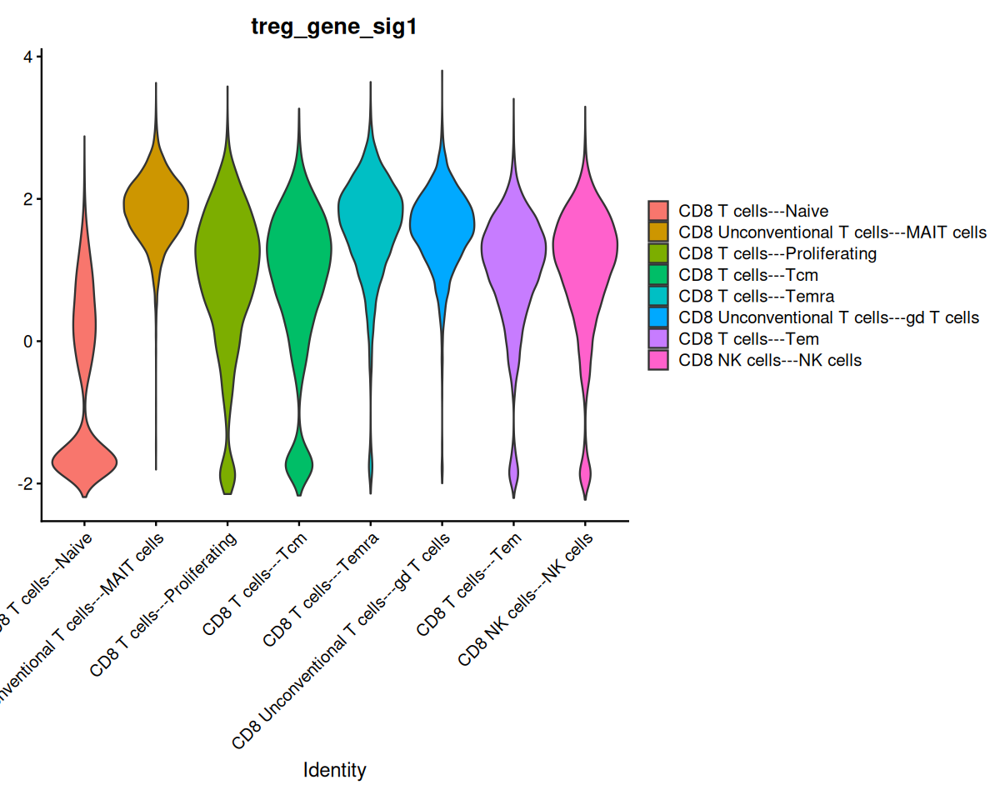

In [22]:
options(repr.plot.width = 10, repr.plot.height = 8)

VlnPlot(cd8_l1_full_filt, features = "treg_gene_sig1", pt.size = 0)

## Tr3-56 published data

In [ ]:
gset <- GEOquery::getGEO('GSE106082')

In [3]:
gset <- readRDS("../data//geo//tr356.rds")

In [4]:
metadata <- data.frame(geo_id = gset$GSE106082_series_matrix.txt.gz$geo_accession,
                       cell_type = gset$GSE106082_series_matrix.txt.gz$`characteristics_ch1.1`
                       )

In [5]:
mtx_tr356  <- read_csv("../../240218_VN_Diabetes_V05/data/published_data/Terrazzano_2020/tr356_df_sum.csv")

New names:
• `` -> `...1`
Rows: 20185 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): SYMBOL
dbl (13): ...1, GSM2829263, GSM2829264, GSM2829265, GSM2829266, GSM2829267, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [6]:
mtx_tr356$`...1`  <- NULL

In [7]:
mtx_tr356  <- mtx_tr356  %>% column_to_rownames("SYMBOL")

In [8]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064


In [9]:
plan("multisession")

In [10]:
packageVersion('matrixStats')

[1] ‘1.5.0’

In [15]:
pred <- SingleR(test = cd8_l1_full_filt@assays$RNA@counts, 
                ref=mtx_tr356, labels=metadata$cell_type, de.method="wilcox",fine.tune = F,num.threads = 4)

In [16]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064


In [18]:
mtx_tr356  <- mtx_tr356  %>% mutate_all(.funs = as.numeric)

In [19]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064


In [20]:
ref_tr3_56 <- list(matrix = mtx_tr356[,c(1:6,10:12)], 
                       labels = metadata$cell_type[c(1:6,10:12)])


In [21]:
mtx_tr356

,GSM2829263,GSM2829264,GSM2829265,GSM2829266,GSM2829267,GSM2829268,GSM2829269,GSM2829270,GSM2829271,GSM2829272,GSM2829273,GSM2829274
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,4.544800,4.882145,4.907298,4.596140,4.605788,4.683674,5.221959,4.804293,4.955937,5.185575,5.015142,4.757583
A1CF,3.774098,3.759367,3.850465,3.735124,3.608670,3.628318,3.557054,3.555598,3.949272,4.006079,3.774020,3.284946
A2M,11.862090,9.336823,10.995440,10.445450,6.410524,9.812895,7.742822,7.747147,8.218060,9.741845,11.048080,10.306250
A2ML1,5.742468,6.357774,5.694543,5.473132,5.229849,5.792858,5.598923,5.852253,5.161205,5.162116,5.502660,4.724673
A3GALT2,4.776125,5.317615,4.755690,4.985246,4.823136,4.758044,4.816776,5.256840,4.975574,4.560531,4.971125,4.878799
A4GALT,3.388180,3.838186,3.463689,3.545921,3.690346,3.766155,3.606695,3.768604,3.618593,3.442958,3.223899,3.567720
A4GNT,5.066483,5.482936,4.696154,4.685892,4.532978,4.260944,5.260707,4.657770,4.834064,4.477656,4.134744,4.403499
AAAS,11.217150,10.195850,10.633160,12.039920,11.120950,11.348270,11.414740,10.613370,11.319590,12.366890,12.556400,12.550780
AACS,5.932485,8.543219,7.625425,5.798914,6.403430,6.301892,6.878719,6.896776,6.220037,5.116759,5.846683,5.842064


In [22]:
ref_tr3_56$labels

[1] "cell subset: TR3-56" "cell subset: TR3-56" "cell subset: TR3-56"
[4] "cell subset: NK"     "cell subset: NK"     "cell subset: NK"    
[7] "cell subset: CD8+"   "cell subset: CD8+"   "cell subset: CD8+"

In [23]:
ref_tr3_56$matrix  <- as.matrix(ref_tr3_56$matrix)

In [24]:
head(rownames(ref_tr3_56$matrix))

[1] "A1BG"    "A1CF"    "A2M"     "A2ML1"   "A3GALT2" "A4GALT"

In [25]:
pred <- SingleR(test = cd8_l1_full_filt@assays$RNA@counts, 
                ref=ref_tr3_56$matrix, labels=ref_tr3_56$labels, 
                fine.tune = T,num.threads = 4
       )

In [26]:
pred

DataFrame with 95229 rows and 4 columns
                                                  scores            labels
                                                <matrix>       <character>
AAACCTGAGATATGCA-1_1_1_1_1_1 0.280852:0.0867496:0.139094 cell subset: CD8+
AAACCTGAGGTGACCA-1_1_1_1_1_1 0.242992:0.1671843:0.234868 cell subset: CD8+
AAACCTGAGTACGATA-1_1_1_1_1_1 0.272481:0.0743748:0.144768 cell subset: CD8+
AAACCTGAGTCGCCGT-1_1_1_1_1_1 0.273309:0.1039935:0.163142 cell subset: CD8+
AAACCTGCATCGTCGG-1_1_1_1_1_1 0.229812:0.0694385:0.111234 cell subset: CD8+
...                                                  ...               ...
TTTGTCACATGTAGTC-1            0.125517:0.225515:0.109110   cell subset: NK
TTTGTCAGTAGGCATG-1            0.234912:0.134102:0.171829 cell subset: CD8+
TTTGTCAGTGCACTTA-1            0.195212:0.234922:0.196008   cell subset: NK
TTTGTCAGTTCCACAA-1            0.274434:0.150048:0.163927 cell subset: CD8+
TTTGTCATCTTACCTA-1            0.224710:0.123677:0.184610 cel

In [27]:
cd8_l1_full_filt$singler  <- pred$labels

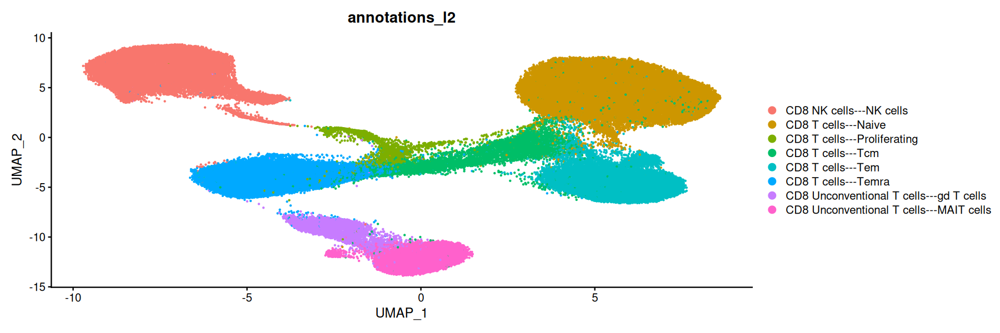

In [28]:
DimPlot(cd8_l1_full_filt, group.by = "annotations_l2")

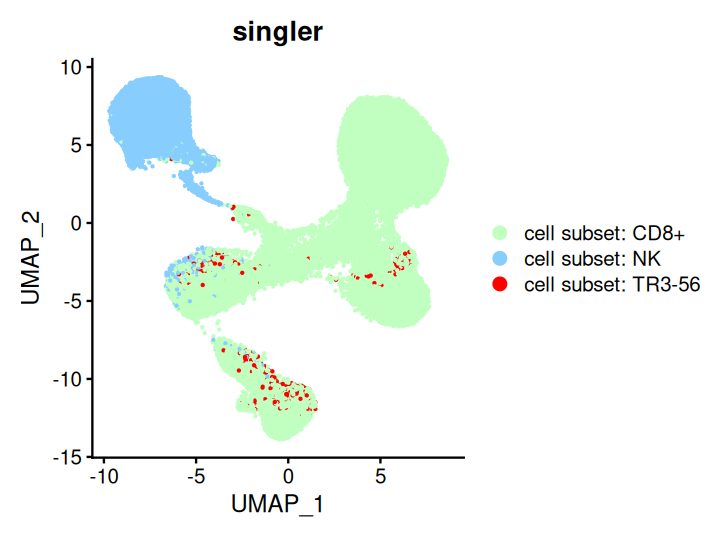

In [29]:
options(repr.plot.width = 6, repr.plot.height = 4.5)
DimPlot(cd8_l1_full_filt, group.by = "singler", shuffle = T, cols = c("darkseagreen1","skyblue1","red"))

In [30]:
pred$scores

cell subset: CD8+,cell subset: NK,cell subset: TR3-56
0.2808525,0.08674960,0.13909381
0.2429921,0.16718431,0.23486846
0.2724811,0.07437481,0.14476796
0.2733090,0.10399354,0.16314171
0.2298121,0.06943852,0.11123423
0.3051759,0.10032563,0.18384715
0.2727046,0.11078187,0.17099600
0.2573054,0.06091804,0.13040462
0.3805704,0.14949842,0.20292781
0.2228941,0.03264640,0.07883570


In [32]:
test  <- data.frame(annotation = cd8_l1_full_filt$annotations_l2,
                    pred = cd8_l1_full_filt$singler)

In [33]:
df2 <- test %>% group_by(annotation, pred) %>% 
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))

`summarise()` has grouped output by 'annotation'. You can override using the
`.groups` argument.


In [34]:
df2

annotation,pred,n,freq
<chr>,<chr>,<int>,<dbl>
CD8 NK cells---NK cells,cell subset: CD8+,238,0.0112534872
CD8 NK cells---NK cells,cell subset: NK,20907,0.9885573786
CD8 NK cells---NK cells,cell subset: TR3-56,4,0.0001891342
CD8 T cells---Naive,cell subset: CD8+,25869,1.0000000000
CD8 T cells---Proliferating,cell subset: CD8+,1987,0.9905284148
CD8 T cells---Proliferating,cell subset: NK,11,0.0054835494
CD8 T cells---Proliferating,cell subset: TR3-56,8,0.0039880359
CD8 T cells---Tcm,cell subset: CD8+,6387,0.9937762564
CD8 T cells---Tcm,cell subset: NK,1,0.0001555936


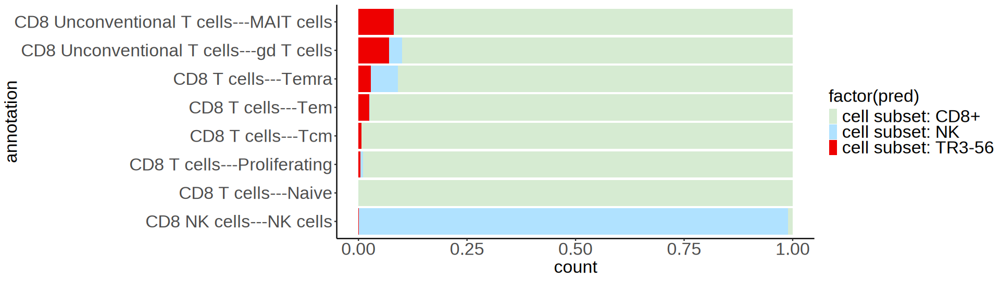

In [55]:
options(repr.plot.width = 16, repr.plot.height = 4.5)
ggplot(test) +
  aes(x = annotation, fill = factor(pred)) +
  geom_bar(position = "fill") + 
theme_classic() + 
ggtheme() +
coord_flip() + 
scale_fill_manual(values = c("#d6ebd2ff", "lightskyblue1", "red2"))
#scale_fill_manual(values = c("grey","#74bc68ff", "dodgerblue3", "red2"))

In [36]:
cd8_l1_full_filt$score_tr356  <- pred$scores[,3]

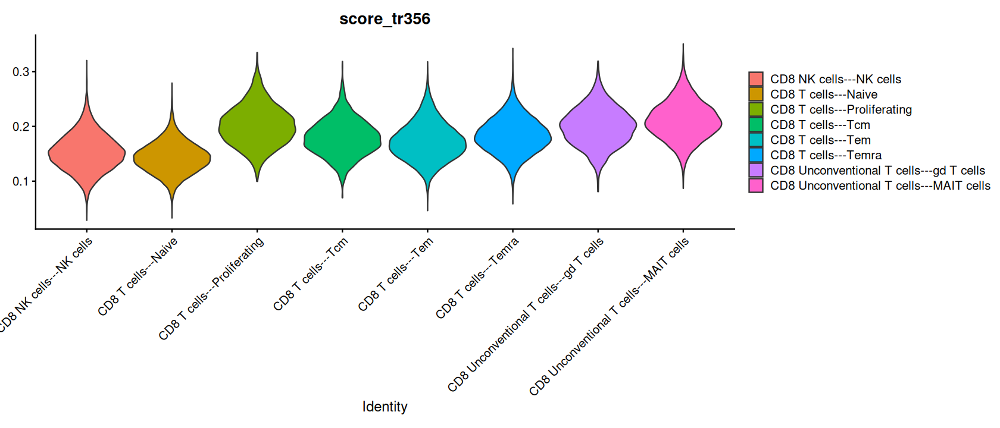

In [56]:
options(repr.plot.width = 14, repr.plot.height = 6)
VlnPlot(cd8_l1_full_filt, features = "score_tr356", group.by = "annotations_l2", pt.size = 0)

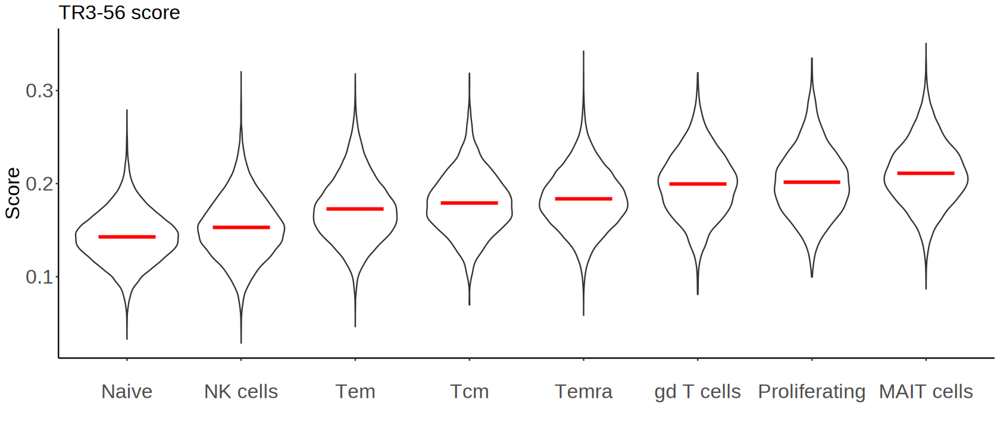

In [38]:
options(repr.plot.width = 14, repr.plot.height = 6)
data.frame(Score = cd8_l1_full_filt$score_tr356,
                  Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = "\n"))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
ggplot(aes(x = fct_reorder(Annotation, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic() + ggtheme() + xlab("")

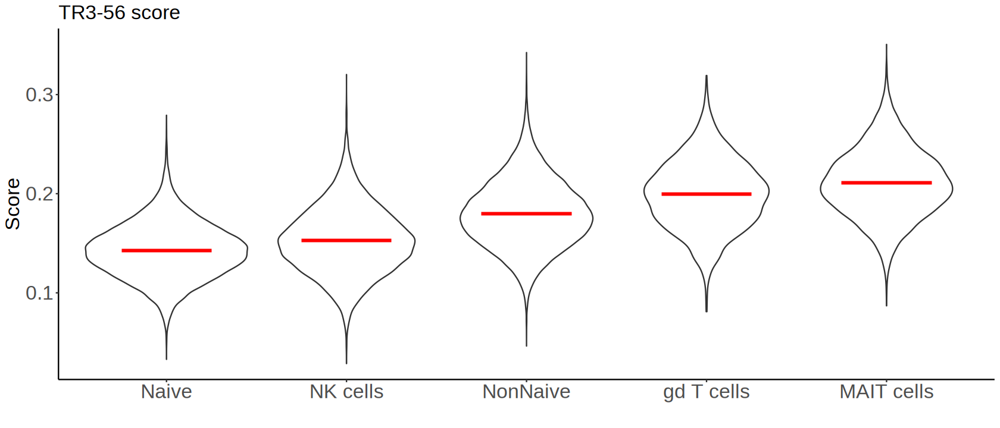

In [39]:
data.frame(Score = cd8_l1_full_filt$score_tr356,
                  Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
mutate(annot2 = case_when(Annotation %in% c("Tem","Tcm","Temra","Proliferating") ~ "NonNaive", 
                          TRUE ~ Annotation))  %>% 
ggplot(aes(x = fct_reorder(annot2, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic() + ggtheme() + xlab("")
# ggsave("../figures/cd356_score.svg", width = 4, height = 3.5)

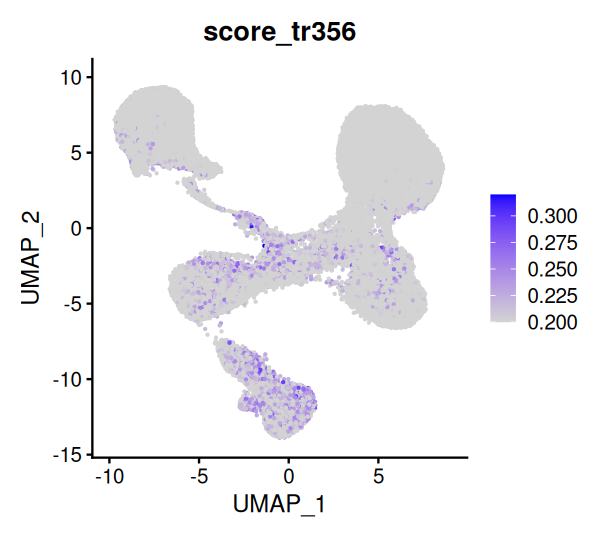

In [40]:
options(repr.plot.width = 5, repr.plot.height = 4.5)

FeaturePlot(cd8_l1_full_filt, features = "score_tr356", min.cutoff = 0.2, max.cutoff = 0.32)

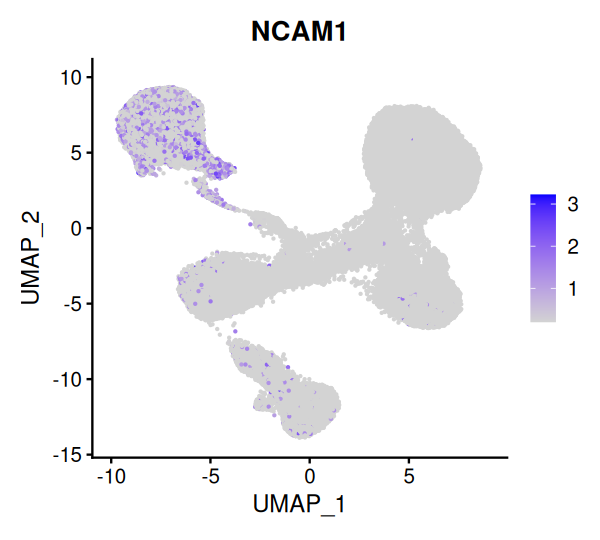

In [41]:
FeaturePlot(cd8_l1_full_filt, features = "NCAM1", min.cutoff = 0.2)

In [42]:
cd8_l1_full_filt

An object of class Seurat 
32114 features across 95229 samples within 10 assays 
Active assay: integrated (1000 features, 1000 variable features)
 2 layers present: data, scale.data
 9 other assays present: RNA, Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3, pathwayswmean, CollecTRI
 2 dimensional reductions calculated: pca, umap

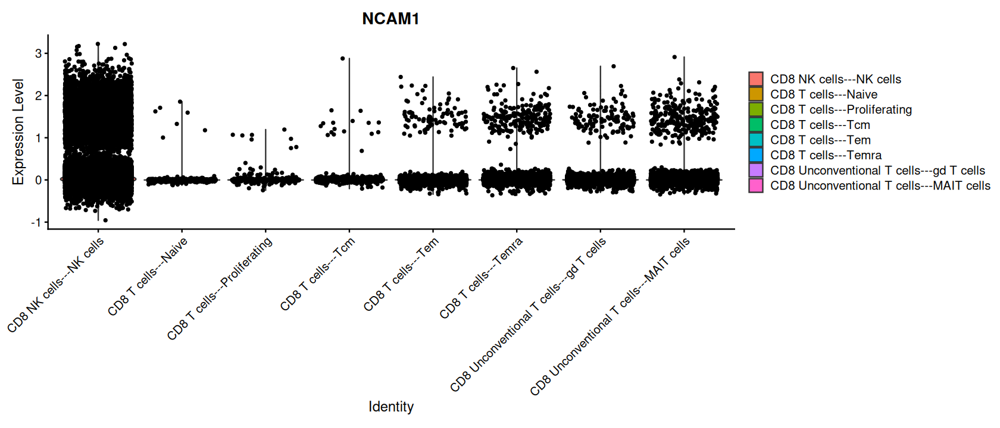

In [57]:
options(repr.plot.width = 14, repr.plot.height = 6)
VlnPlot(cd8_l1_full_filt, features = "NCAM1", group.by = "annotations_l2")

In [44]:
cd8_l1_full_filt@meta.data  <- cd8_l1_full_filt@meta.data  %>% 
mutate(Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
mutate(annot2 = case_when(Annotation %in% c("Tem","Tcm","Temra","Proliferating") ~ "NonNaive", 
                          TRUE ~ Annotation)) 

In [45]:
cd8_l1_full_filt$annotations_l2_sample  <- paste(cd8_l1_full_filt$annot2, cd8_l1_full_filt$Sample_ID)

In [46]:
cd8_l1_full_filt$annotations_l2_sample   %>% table

.
gd T cells 151 gd T cells 153 gd T cells 154 gd T cells 155 gd T cells 186 
             8              3              4              3             22 
gd T cells 187 gd T cells 188 gd T cells 189 gd T cells 190 gd T cells 191 
            14            115             51              5             14 
gd T cells 192 gd T cells 193 gd T cells 194 gd T cells 287 gd T cells 288 
            41              4             15             29             23 
gd T cells 289 gd T cells 290 gd T cells 291 gd T cells 292 gd T cells 293 
            28             78             40             56             71 
gd T cells 294 gd T cells 295 gd T cells 307 gd T cells 308 gd T cells 309 
            51             38            110             35             12 
gd T cells 310 gd T cells 311 gd T cells 312 gd T cells 313 gd T cells 314 
             9             41             41             98             13 
gd T cells 315 gd T cells 316 gd T cells 331 gd T cells 332 gd T cells 333 
          

In [47]:
# Extract the dataframe with seurat metadata
seurat_meta_data <- cd8_l1_full_filt@meta.data
seurat_meta_data$sample <- seurat_meta_data$annotations_l2_sample

# Select genes of interest
# The script only works for two or more genes, you can't select just one!
gene_hits <- c("NCAM1", "TRGC1", "CD8A", "CD8B", 
               "FCGR3A","CD3D","CD3G","CD3Z")

# By default the percentage of calculated cells is computed for whole sample
# Optionally, you can select a cluster that you're interested in by subsetting:
# pbmc_small <- subset(pbmc_small, seurat_clusters == 3)


# Now we will calculate the percentage of expressing cells for each sample and we will merge the resulting dataframes
expr_data4 <- data.frame(genes = gene_hits)

# We will need a function that will convert any non-zero count to value 1
fns_replace <- function(x){ifelse(x>0,1,0)}

for(j in (pull(seurat_meta_data, sample)  %>% unique)){
  
  # subset only selected cell type
  seu_sub_sample <- subset(cd8_l1_full_filt, annotations_l2_sample == j) 
  
  # select the rows corresponding to genes of interest
  index_subset <- which(rownames(seu_sub_sample@assays$RNA@counts) %in% gene_hits)
  
  # create a dataframe with genes of interest and cells of interest
  expr_data <- as.data.frame(seu_sub_sample@assays$RNA@counts[index_subset,]) 
  
  # convert expression to binary values
  expr_data2 <- expr_data %>% mutate(across(.fns = fns_replace))
  rownames(expr_data2) <- rownames(expr_data)
  
  # calculate average expresion (percentage of cells expressing the gene)
  expr_data3 <- rowMeans(expr_data2)
  
  # add zeroes in cases of no expression
  for(k in gene_hits){
    if(k %in% names(expr_data3) == F){expr_data3[[k]] <- 0}
  }
  
  expr_data3 <- as.data.frame(expr_data3)
  colnames(expr_data3) <- j
  expr_data3$genes <- rownames(expr_data3)
  
  # final dataframe with values in correct order (all cell type, loop results)
  expr_data4 <- left_join(expr_data4, expr_data3, by="genes")
  
}

# Now we have the whole dataframe, we just need to tidy it a bit, add metadata and visualize

expr_data5 <- as.data.frame(t(expr_data4))
colnames(expr_data5) <- expr_data5[1,]
expr_data5 <- expr_data5[2:nrow(expr_data5),]
expr_data5$sample <- rownames(expr_data5)
expr_data5 <- expr_data5 %>% pivot_longer( !sample, names_to = "gene", values_to = "pct_express")

# Add metadata per sample - select those that you will use in the plot below
md_to_join <- seurat_meta_data %>% dplyr::select(sample = annotations_l2_sample)  %>% 
unique() %>% mutate(sample = as.character(sample))
md2 <- left_join(expr_data5, md_to_join, by = "sample") %>% ungroup %>% unique



Warning message:
“There was 1 warning in `mutate()`.
ℹ In argument: `across(.fns = fns_replace)`.
Caused by warning:
! Using `across()` without supplying `.cols` was deprecated in dplyr 1.1.0.
ℹ Please supply `.cols` instead.”


In [48]:
md2

sample,gene,pct_express
<chr>,<chr>,<chr>
Naive 150,NCAM1,0.000000000
Naive 150,TRGC1,0.005069708
Naive 150,CD8A,0.879594423
Naive 150,CD8B,0.983523447
Naive 150,FCGR3A,0.000000000
Naive 150,CD3D,0.923954373
Naive 150,CD3G,0.641318124
Naive 150,CD3Z,0.000000000
MAIT cells 150,NCAM1,0.0


In [49]:
md2 %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3)) 

sample,gene,pct_express,Sample_ID,population
<chr>,<chr>,<chr>,<chr>,<chr>
Naive 150,NCAM1,0.000000000,150,Naive
Naive 150,TRGC1,0.005069708,150,Naive
Naive 150,CD8A,0.879594423,150,Naive
Naive 150,CD8B,0.983523447,150,Naive
Naive 150,FCGR3A,0.000000000,150,Naive
Naive 150,CD3D,0.923954373,150,Naive
Naive 150,CD3G,0.641318124,150,Naive
Naive 150,CD3Z,0.000000000,150,Naive
MAIT cells 150,NCAM1,0.0,150,MAIT cells


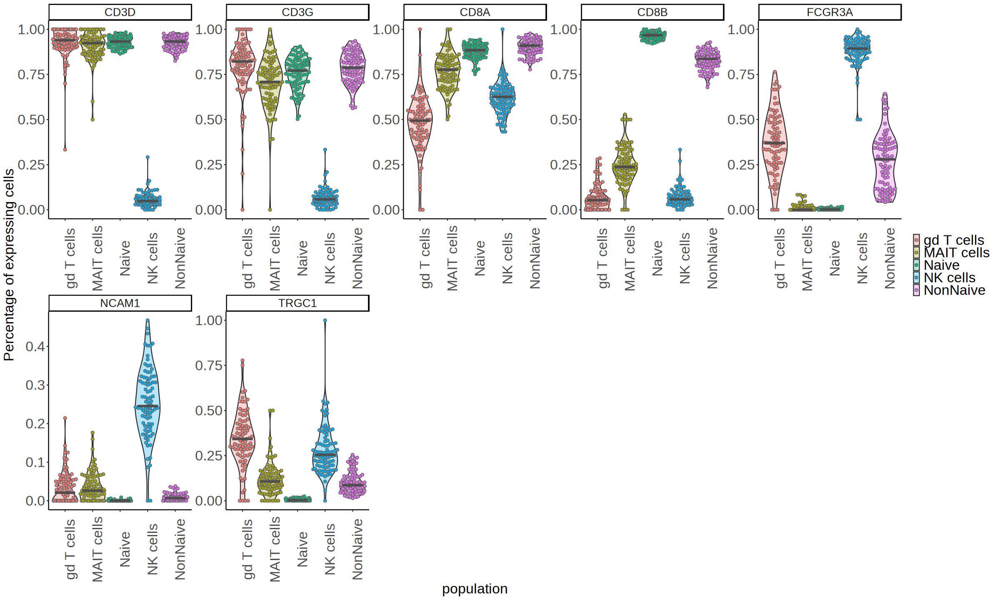

In [50]:
options(repr.plot.width = 20, repr.plot.height = 12)

md2 %>% 
dplyr::filter(gene != "CD3Z")  %>% 
pivot_wider(names_from = "gene", values_from = "pct_express", values_fill = "0")  %>% 
pivot_longer(cols = c(2:8), names_to = "gene", values_to = "pct_express")  %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3))  %>% 
ggplot(aes(x = population, y = as.numeric(pct_express))) + 
 geom_violin(alpha = 0.3, aes(fill = population), scale = "width") + 
 
geom_beeswarm(size = 1.5, aes(fill = population), cex = 2, 
                shape = 21, color = "grey40",corral = "random") +
 stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
 #stat_compare_means(label = "p.format", comparisons = list(c(1,2))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
#ggpubr::stat_compare_means()+
  ylab("Percentage of expressing cells") +
  theme_classic() + ggtheme() +
 theme(legend.title = element_blank(),axis.text.x = element_text(angle = 90)) 

#ggsave("../figures/scRNAseq_gd_characterization.svg", width = 13, height = 9)

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.
Warning message:
“Removed 392 rows containing missing values or values outside the scale range
(`geom_point()`).”


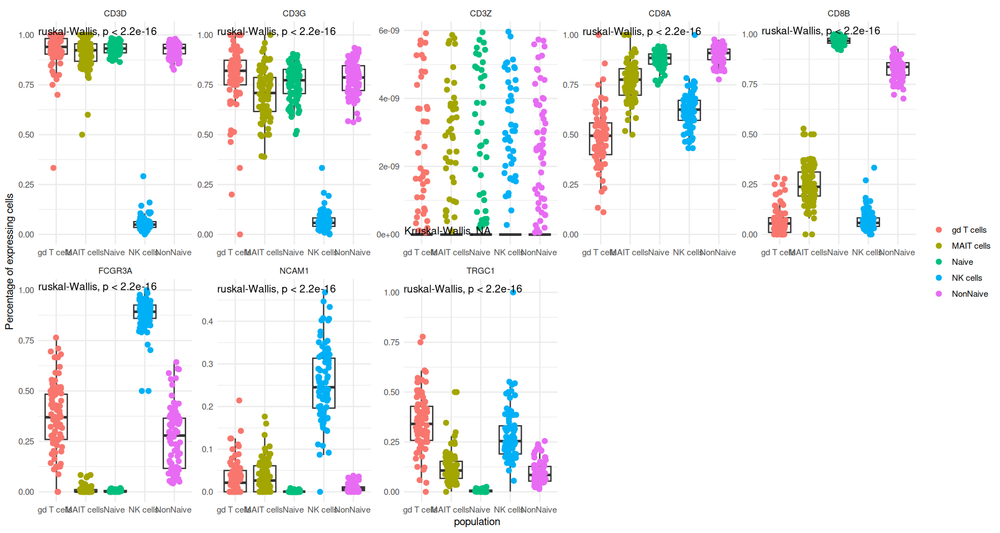

In [51]:
options(repr.plot.width = 15, repr.plot.height = 8)

md2 %>% 
pivot_wider(names_from = "gene", values_from = "pct_express", values_fill = "0")  %>% 
pivot_longer(cols = c(2:9), names_to = "gene", values_to = "pct_express")  %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3))  %>% 
ggplot(aes(x = population, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(population))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
ggpubr::stat_compare_means()+
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank())

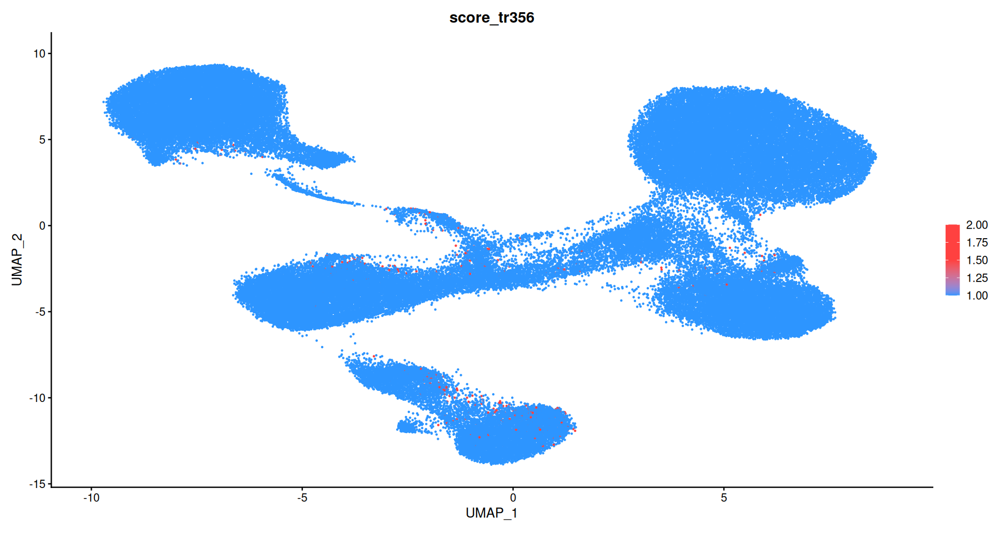

In [52]:
FeaturePlot(cd8_l1_full_filt, features = "score_tr356", min.cutoff = 0.2, cols = c("#2d95ffff","#ff4140ff","#ff4140ff"))

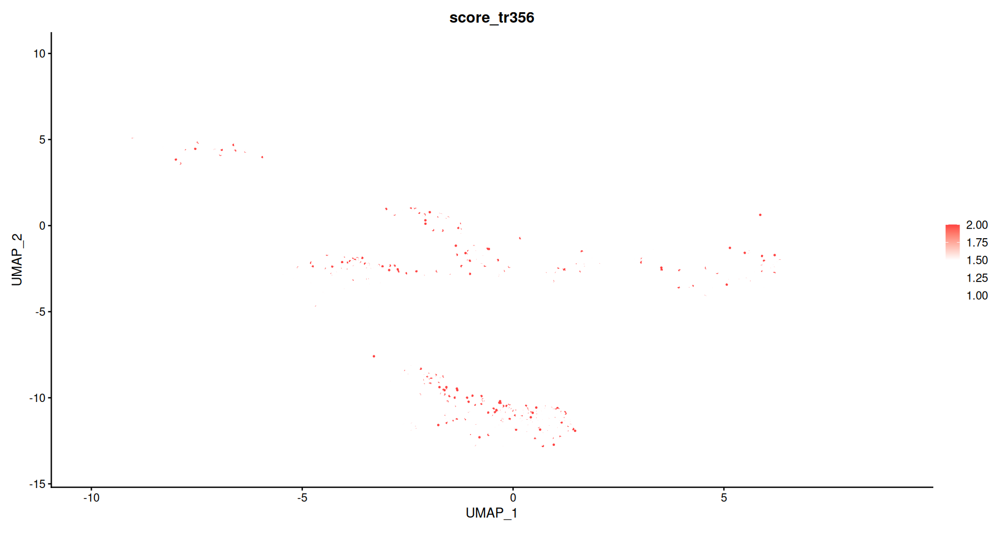

In [53]:
FeaturePlot(cd8_l1_full_filt, features = "score_tr356", min.cutoff = 0.2, cols = c("white","white","#ff4140ff"))

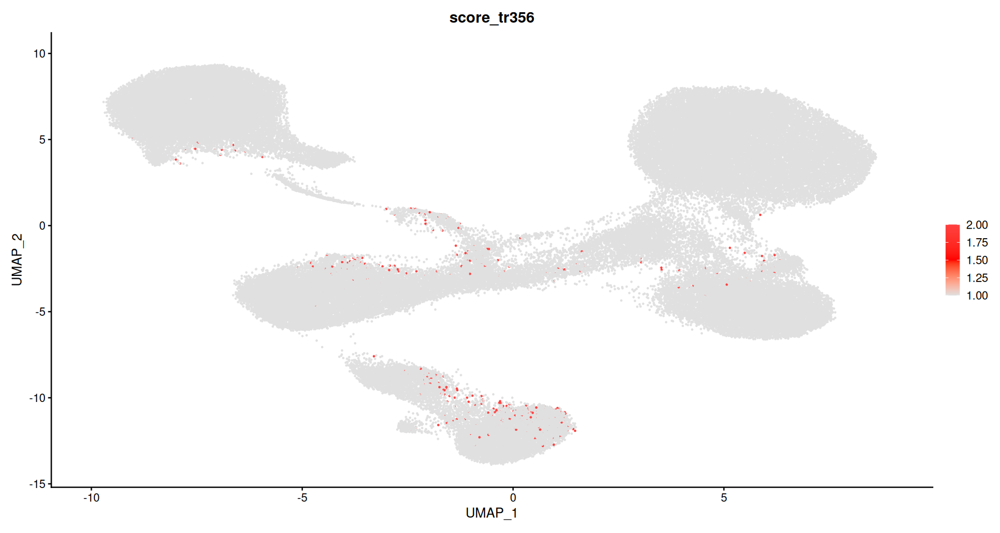

In [54]:
FeaturePlot(cd8_l1_full_filt, features = "score_tr356", min.cutoff = 0.2, cols = c("grey88","red","#ff4140ff"))

### Without CD3+CD56- 

In [ ]:
gset <- getGEO("GSE106082", GSEMatrix =TRUE, getGPL=TRUE, AnnotGPL=TRUE)

In [ ]:
metadata <- data.frame(geo_id = gset$GSE106082_series_matrix.txt.gz$geo_accession,
                       cell_type = gset$GSE106082_series_matrix.txt.gz$`characteristics_ch1.1`
                       )

In [ ]:
mtx_tr356  <- read_csv("../data/published_data/Terrazzano_2020/tr356_df_sum.csv")

In [ ]:
mtx_tr356$`...1`  <- NULL

In [ ]:
mtx_tr356  <- mtx_tr356  %>% column_to_rownames("SYMBOL")

In [ ]:
mtx_tr356  <- mtx_tr356  %>% mutate_all(.funs = as.numeric)

In [ ]:
mtx_tr356

In [ ]:
ref_tr3_56 <- list(matrix = mtx_tr356, 
                       labels = metadata$cell_type)


In [ ]:
mtx_tr356

In [ ]:
ref_tr3_56$labels

In [ ]:
ref_tr3_56$matrix  <- as.matrix(ref_tr3_56$matrix)

In [ ]:
head(rownames(ref_tr3_56$matrix))

In [ ]:
pred <- SingleR(test = cd8_l1_full_filt@assays$RNA@counts, 
                ref=ref_tr3_56$matrix, labels=ref_tr3_56$labels, 
                fine.tune = T,num.threads = 4
       )

In [ ]:
pred


In [ ]:
cd8_l1_full_filt$singler  <- pred$labels

In [ ]:
DimPlot(cd8_l1_full_filt, group.by = "annotations_l2")

In [ ]:
DimPlot(cd8_l1_full_filt, group.by = "singler", shuffle = T, cols = c("purple","grey88","dodgerblue","red"))

In [ ]:
test  <- data.frame(annotation = cd8_l1_full_filt$annotations_l2,
                    pred = cd8_l1_full_filt$singler)

In [ ]:
df2 <- test %>% group_by(annotation, pred) %>% 
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))

In [ ]:
df2

In [ ]:
df2

In [ ]:
cd8_l1_full_filt$score_tr356  <- pred$scores[,4]

In [ ]:
VlnPlot(cd8_l1_full_filt, features = "score_tr356", group.by = "annotations_l2")

In [ ]:
options(repr.plot.width = 14, repr.plot.height = 6)
data.frame(Score = cd8_l1_full_filt$score_tr356,
                  Annotation = gsub(cd8_l1_full_filt$annotations_l2, pattern = "---", replacement = "\n"))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 Unconventional T cells", replacement = ""))  %>% 
mutate(Annotation = gsub(Annotation, pattern = "CD8 NK cells", replacement = ""))  %>% 
ggplot(aes(x = fct_reorder(Annotation, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "crossbar", 
               width = 0.5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic() + ggtheme() + xlab("")

In [ ]:
FeaturePlot(cd8_l1_full_filt, features = "NCAM1", min.cutoff = 0.2)

In [ ]:
FeaturePlot(cd8_l1_full_filt, features = "NCAM1", min.cutoff = 0.2)

In [ ]:
VlnPlot(cd8_l1_full_filt, features = "NCAM1", group.by = "annotations_l2")

In [ ]:
cd8_l1_full_filt$annotations_l2_sample  <- paste(cd8_l1_full_filt$annotations_l2, cd8_l1_full_filt$Sample_ID)

In [ ]:
cd8_l1_full_filt$annotations_l2_sample   %>% table

In [ ]:
# Extract the dataframe with seurat metadata
seurat_meta_data <- cd8_l1_full_filt@meta.data
seurat_meta_data$sample <- seurat_meta_data$annotations_l2_sample

# Select genes of interest
# The script only works for two or more genes, you can't select just one!
gene_hits <- c("NCAM1", "TRGC1", "CD8A", "CD8B", 
               "FCGR3A","CD3D","CD3G","CD3Z")

# By default the percentage of calculated cells is computed for whole sample
# Optionally, you can select a cluster that you're interested in by subsetting:
# pbmc_small <- subset(pbmc_small, seurat_clusters == 3)


# Now we will calculate the percentage of expressing cells for each sample and we will merge the resulting dataframes
expr_data4 <- data.frame(genes = gene_hits)

# We will need a function that will convert any non-zero count to value 1
fns_replace <- function(x){ifelse(x>0,1,0)}

for(j in (pull(seurat_meta_data, sample)  %>% unique)){
  
  # subset only selected cell type
  seu_sub_sample <- subset(cd8_l1_full_filt, annotations_l2_sample == j) 
  
  # select the rows corresponding to genes of interest
  index_subset <- which(rownames(seu_sub_sample@assays$RNA@counts) %in% gene_hits)
  
  # create a dataframe with genes of interest and cells of interest
  expr_data <- as.data.frame(seu_sub_sample@assays$RNA@counts[index_subset,]) 
  
  # convert expression to binary values
  expr_data2 <- expr_data %>% mutate(across(.fns = fns_replace))
  rownames(expr_data2) <- rownames(expr_data)
  
  # calculate average expresion (percentage of cells expressing the gene)
  expr_data3 <- rowMeans(expr_data2)
  
  # add zeroes in cases of no expression
  for(k in gene_hits){
    if(k %in% names(expr_data3) == F){expr_data3[[k]] <- 0}
  }
  
  expr_data3 <- as.data.frame(expr_data3)
  colnames(expr_data3) <- j
  expr_data3$genes <- rownames(expr_data3)
  
  # final dataframe with values in correct order (all cell type, loop results)
  expr_data4 <- left_join(expr_data4, expr_data3, by="genes")
  
}

# Now we have the whole dataframe, we just need to tidy it a bit, add metadata and visualize

expr_data5 <- as.data.frame(t(expr_data4))
colnames(expr_data5) <- expr_data5[1,]
expr_data5 <- expr_data5[2:nrow(expr_data5),]
expr_data5$sample <- rownames(expr_data5)
expr_data5 <- expr_data5 %>% pivot_longer( !sample, names_to = "gene", values_to = "pct_express")

# Add metadata per sample - select those that you will use in the plot below
md_to_join <- seurat_meta_data %>% dplyr::select(sample = annotations_l2_sample)  %>% 
unique() %>% mutate(sample = as.character(sample))
md2 <- left_join(expr_data5, md_to_join, by = "sample") %>% ungroup %>% unique



In [ ]:
md2

In [ ]:
md2 %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3)) 

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 8)

md2 %>% 
pivot_wider(names_from = "gene", values_from = "pct_express", values_fill = "0")  %>% 
pivot_longer(cols = c(2:9), names_to = "gene", values_to = "pct_express")  %>% 
mutate(Sample_ID = substr(sample,nchar(sample)-3,nchar(sample)))  %>% 
mutate(population = substr(sample,1,nchar(sample)-3))  %>% 
ggplot(aes(x = population, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(population))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
ggpubr::stat_compare_means()+
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank())

In [ ]:
ggplot(test) +
  aes(x = annotation, fill = factor(pred)) +
  geom_bar(position = "fill") + 
theme_classic() + 
ggtheme() +
coord_flip() + 
scale_fill_manual(values = c("#74bc68ff","#d6ebd2ff", "#bde0f7ff", "red2"))
#scale_fill_manual(values = c("grey","#74bc68ff", "dodgerblue3", "red2"))

In [ ]:
cd8_l1_full_filt

# DE genes heatmap avg.

In [ ]:
avgexp = AverageExpression(subset(cd8_l1_full_filt, Experiment_ID %in% c("Exp16","Exp18","Exp19","Exp20")), 
                             return.seurat = F, group.by = "Patient_Time", 
                          assay = "RNA")

In [ ]:
avgexp$RNA[which(rownames(avgexp$RNA)=="GNLY"),]  %>% as.data.frame()

## Heatmap

### All cells

In [ ]:
cd8_l1_full_filt$Patient_Time_Disease  <- paste(cd8_l1_full_filt$Patient_ID, cd8_l1_full_filt$Time, 
                                               cd8_l1_full_filt$Disease)

In [ ]:
cd8_l1_full_filt$Disease_time  <- paste(
                                               cd8_l1_full_filt$Disease,
cd8_l1_full_filt$Time)

In [ ]:
avgexp = AverageExpression(subset(cd8_l1_full_filt, Experiment_ID %in% c("Exp16","Exp18","Exp19","Exp20")), 
                             return.seurat = F, group.by = "Disease_time", 
                          assay = "RNA")

In [ ]:
genes  <- c("PCBP2","PCBP1",
            "CX3CR1","TNF","GZMB","GZMA","PRF1","NKG7","GNLY","CCL5","CST7",
            "BTG1","SELL","IL7R","CCR7","BTG2","SLAMF6","LEF1",
             "TNFAIP3","TSC22D3","NKFBIA","DUSP1")

In [ ]:
avgexp  <- avgexp$RNA[which(rownames(avgexp$RNA) %in% genes),]

In [ ]:
library(pheatmap)

options(repr.plot.width = 4, repr.plot.height = 9)
pheatmap(avgexp, main = "", scale = "row", cluster_cols = F, cluster_rows = T,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 9, height = 3.3,
                  fontsize = 9)

In [ ]:
dir.create("../tables/avg_heatmap/")
write.csv(avgexp, "../tables/avg_heatmap/cd8_avg.csv")

### Average of patient

In [ ]:
genes  <- c("PCBP2","PCBP1",
            "CX3CR1","TNF","GZMB","GZMA","PRF1","NKG7","GNLY","CCL5","CST7",
            "BTG1","SELL","IL7R","CCR7","BTG2","SLAMF6","LEF1",
             "TSC22D3","NKFBIA","DUSP1","CXCR4","PI3KR1","CCL4", "IFI44L","EPSTI1","MX1", "FOXO1", "ISG15")

In [ ]:
avgexp = AverageExpression(subset(cd8_l1_full_filt, Experiment_ID %in% c("Exp16","Exp18","Exp19","Exp20")), 
                             return.seurat = T, group.by = "Patient_Time_Disease", 
                          assay = "RNA")

In [ ]:
avgexp$Patient_Time_Disease  <- colnames(avgexp)
avgexp@meta.data  <- avgexp@meta.data  %>% 
separate(Patient_Time_Disease, into = c("Patient", "Time", "Disease"), sep = " ", remove = F)

In [ ]:
avgexp$Disease_Time  <- paste(avgexp$Disease, avgexp$Time)

In [ ]:
avgexp2 = AverageExpression(avgexp, 
                             return.seurat = F, group.by = "Disease_Time")

In [ ]:
avgexp3  <- avgexp2$RNA[which(rownames(avgexp2$RNA) %in% genes),]

In [ ]:
avgexp3

In [ ]:
options(repr.plot.width = 4, repr.plot.height = 9)
pheatmap(avgexp3, main = "", scale = "row", cluster_cols = F, cluster_rows = T,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 9, height = 3.3,
                  fontsize = 9)

In [ ]:
write.csv(avgexp3, "../tables/avg_heatmap/cd8_avg_by_patient.csv")

In [ ]:
genes2  <- c("PCBP2","PCBP1","CXCR4","FOXO1","IL7R","LEF1","CCR7","SELL",
             "DUSP1","TSC22D3","NFKBIA","TNFAIP3",
             "IFI44L","ISG15","MX1","EPSTI1",
            "PRF1","NKG7","GZMB","CST7","GNLY","GZMA","CX3CR1","CCL5","TNF"
            )

In [ ]:
avgexp3  <- avgexp2$RNA[which(rownames(avgexp2$RNA) %in% genes2),]

In [ ]:
pheatmap(avgexp3[match(genes2,rownames(avgexp3)),], 
         main = "", scale = "row", cluster_cols = F, cluster_rows =F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 5, height = 10,
                  fontsize = 9)

In [ ]:
options(repr.plot.width = 4, repr.plot.height = 9)
pheatmap(avgexp3[match(genes2,rownames(avgexp3)),], 
         main = "", scale = "row", cluster_cols = F, cluster_rows =F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 5, height = 10,
                  fontsize = 9,
        filename = "../figures/heatmaps/de_genes_cd8.pdf")

In [ ]:
plot_gene  <- function(gene){
    df  <- as.data.frame(avgexp$RNA[which(rownames(avgexp$RNA)==gene),])  %>% rownames_to_column("Patient_Time")
    colnames(df)[2]  <- "gene2"
    df  <-  df  %>% separate(Patient_Time, into = c("Patient","Time"), sep = " ", remove = F)  %>% 
    mutate(group = ifelse(substr(Patient,1,1)=="1","Dia","Ctrl"))  %>% 
    mutate(Condition = paste(group, Time))
   # print(df)
 p  <-    df  %>% ggplot(aes(x = Condition, y = gene2)) + 
 geom_violin(alpha = 0.3, aes(fill = Condition), scale = "width") + 
stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
geom_beeswarm(size = 3, aes(fill = Condition), cex = 3, 
                shape = 21, color = "black", corral = "random") +
 stat_compare_means(label = "p.format", comparisons = list(c(1,2))) +
scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
ylab("") +
  xlab("") +
  ylim(0,NA) +
  theme_classic() +
theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_text(angle = 90),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) +
  ggtitle(gene) + ggtheme()
    
    p2  <-    df  %>% dplyr::filter(Patient != 116)  %>% ggplot(aes(x = Condition, y = gene2)) + 
 geom_violin(alpha = 0.3, aes(fill = Condition), scale = "width") + 
stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
geom_beeswarm(size = 3, aes(fill = Condition), cex = 3, 
                shape = 21, color = "black", corral = "random") +
 stat_compare_means(label = "p.format", comparisons = list(c(2,3)), paired = TRUE) +
scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
ylab("") +
  xlab("") +
  ylim(0,NA) +
  theme_classic() +
theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_text(angle = 90),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) +
  ggtitle(gene) + ggtheme()
    p  <- p + p2
    return(p)
    }

In [ ]:
plot_gene2  <- function(gene){
    options(repr.plot.width = 2.5, repr.plot.height = 4)
    df  <- as.data.frame(avgexp$RNA[which(rownames(avgexp$RNA)==gene),])  %>% rownames_to_column("Patient_Time")
    colnames(df)[2]  <- "gene2"
    df  <-  df  %>% separate(Patient_Time, into = c("Patient","Time"), sep = " ", remove = F)  %>% 
    mutate(group = ifelse(substr(Patient,1,1)=="1","Dia","Ctrl"))  %>% 
    mutate(Condition = paste(group, Time))
   # print(df)
 p  <-    df  %>% ggplot(aes(x = Condition, y = gene2)) + 
 geom_violin(alpha = 0.3, aes(fill = Condition), scale = "width") + 
stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
geom_beeswarm(size = 3, aes(fill = Condition), cex = 3, 
                shape = 21, color = "black", corral = "random") +
 stat_compare_means(label = "p.format", comparisons = list(c(1,2))) +
scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
ylab("") +
  xlab("") +
  ylim(0,NA) +
  theme_classic() +
theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_blank(),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) +
  ggtitle(gene) + ggtheme() + NoLegend()
  
    return(p)
    }

In [ ]:
plot_gene("IFI44L")

In [ ]:
plot_gene2("NKG7")

In [ ]:
plot_gene2("BTN3A2")

In [ ]:
plot_gene("ASCL2")

In [ ]:
plot_gene("DUSP1")

In [ ]:
plot_gene("TSC22D3")

In [ ]:
plot_gene("RBM3")

In [ ]:
plot_gene("GADD45B")

In [ ]:
DimPlot(cd8_l2_nk)

In [ ]:
options(repr.plot.width = 4, repr.plot.height = 4)
FeaturePlot(cd8_l2_nk, features = "NCAM1", min.cutoff = 0)

In [ ]:
FeaturePlot(cd8_l2_nk, features = "HLA-DRB1", min.cutoff = 0)

In [ ]:
FeaturePlot(cd8_l2_nk, features = "CCR7", min.cutoff = 0)

## gd CD8

In [ ]:
gd  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L2/cd8_l2_unc.rds")

In [ ]:
gd

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 5)
DimPlot(gd, group.by = "annotations_manual", cols = gd@misc$cols_annotations)

In [ ]:
df4  <- create_df4(gd)

In [ ]:
df4

In [ ]:
p5  <-   df4  %>% 
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq*100)) + # you can change the x to whatever variable you're interested in
   geom_violin(alpha = 0.3, aes(fill = Condition)) +
  stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
   scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
geom_beeswarm(size = 3, cex = 3, 
              color = "black", method = "center",
             aes(fill = Condition), shape = 21) +
   facet_wrap(~annotations_manual, scales = "free", ncol = 9) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.5, 
                           size = 7, vjust = -1, label = "p.format", comparisons = list(c(1,2)))+
ggtheme() +
 scale_y_continuous(limits = c(0,NA), expand = c(0.05,0,0,10)) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_text(angle = 90),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) + NoLegend() + ggtitle("Final data all groups")
ncols = length(levels(factor(df4$annotations_manual)))

In [ ]:
p5

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 7)

p5

ggsave("../figures/subset_characterization/tgd_subsets_in_condition.svg",
       width = 30, height = 12, units = "cm")

In [ ]:
  p5  <-   df4  %>% 
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
dplyr::filter(Patient_ID != "116")  %>% 
  ggplot(aes(x = Condition, y = freq*100)) + # you can change the x to whatever variable you're interested in
   geom_violin(alpha = 0.3, aes(fill = Condition)) +
  stat_summary(fun = "median",
               geom = "crossbar", 
               width = 0.75,
               color = "grey30") +
   scale_fill_manual(values = c("#1874cdff",  "#ee6363ff", "#c41515ff","#eeb4b4ff")) +
scale_color_manual(values = c("dodgerblue3",  "#e54c4cff", "#aa2a2aff","#e88989ff")) +
geom_beeswarm(size = 3, cex = 3, 
              color = "black", method = "center",
             aes(fill = Condition), shape = 21) +
   facet_wrap(~annotations_manual, scales = "free", ncol = 9) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.5, 
                           size = 7, vjust = -1, label = "p.format", comparisons = list(c(2,3)), paired = TRUE)+
ggtheme() +
 scale_y_continuous(limits = c(0,NA), expand = c(0.05,0,0,10)) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.text.x = element_text(angle = 90),
       axis.line = element_line(color = "black", size = 0.5),
        axis.ticks.x = element_blank()) + NoLegend() + ggtitle("Final data all groups")
ncols = length(levels(factor(df4$annotations_manual)))

In [ ]:
p5

In [ ]:
scCustomize::Plot_Density_Custom(seurat_object = gd, features = "CD8A", custom_palette = c("lightblue","khaki1","red")) 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 4)
DimPlot(gd, group.by = "annotations_manual", 
        cols = rep("grey88",times = 6))

In [ ]:
cd8_l1_full_filt  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L1/cd8_l1_full_filt.rds")

In [ ]:
cd8_l1_full_filt@meta.data  <- left_join(cd8_l1_full_filt@meta.data, md_gd)

In [ ]:
md_gd  <- data.frame(barcode = colnames(gd), 
                     gd$annotations_manual)

In [ ]:
table(md_gd$barcode %in% colnames(cd8_l1_full_filt))

In [ ]:
cd8_l1_full_filt$gd.annotations_manual  %>% table

In [ ]:
rownames(cd8_l1_full_filt@meta.data)  <- colnames(cd8_l1_full_filt)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 7.5)
DimPlot(cd8_l1_full_filt, group.by = "gd.annotations_manual", cols = gd@misc$cols_annotations)

In [ ]:
FeaturePlot(gd, features = c("ISG15", "IRF7","MX1","MKI67"), ncol = 4)

In [ ]:
DimPlot(gd, group.by = "annotations_manual", split.by = "Condition")

In [ ]:
options(repr.plot.width = 22, repr.plot.height = 22)

DimPlot(gd, group.by = "annotations_manual", split.by = "Patient_ID", ncol = 5)

In [ ]:
gd_subset  <- subset(gd, Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20")) 

density  <- gd_subset@meta.data  %>% dplyr::select(Sample_ID, Condition)

density$x_umap  <- gd_subset@reductions$umap@cell.embeddings[,1]
density$y_umap  <- gd_subset@reductions$umap@cell.embeddings[,2]


library(ggplot2)
library(dplyr)
library(viridis)

colfunc <- colorRampPalette(c("white", "grey85","grey75","dodgerblue","green","yellow","red"))


options(repr.plot.width = 22, repr.plot.height = 5)

p1  <- density %>%
dplyr::filter(Condition == "Dia T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,7)+  ylim(-7,5) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T0") + NoLegend()

p2   <-   density %>%
dplyr::filter(Condition == "Ctrl T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,7)+  ylim(-7,5) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Ctrl T0") + NoLegend()

p3  <-   density %>%
dplyr::filter(Condition == "Dia T1")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,7)+  ylim(-7,5) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T1") 

p1 + p2 + p3

In [ ]:
gd_subset  <- subset(gd, annotations_manual %in% c("CD8Tgd1: FGFBP2 GZMH GZMB","CD8Tgd2: TRDV2 SELL COTL1") &
                    )


In [ ]:
density  <- gd_subset@meta.data  %>% dplyr::select(Sample_ID, Condition)

density$x_umap  <- gd_subset@reductions$umap@cell.embeddings[,1]
density$y_umap  <- gd_subset@reductions$umap@cell.embeddings[,2]

density

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 5)

p1  <- density %>%
dplyr::filter(Condition == "Dia T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,5)+ 
#ylim(-12,6) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T0") + NoLegend()

p2   <-   density %>%
dplyr::filter(Condition == "Dia T1")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,5)+  
#ylim(-12,6) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Dia T1") + NoLegend()

p3  <-   density %>%
dplyr::filter(Condition == "Ctrl T0")  %>% 
  ggplot(aes(x=x_umap, y= y_umap)) + 
 geom_point(shape = "")  + geom_density_2d_filled(bins = 40)  + 
theme_classic() + ggtheme() +
xlim(-10,5)+  
#ylim(-12,6) +
scale_fill_manual(values = colfunc(40))  + 
ggtitle("Ctrl")  + NoLegend()

p1 + p2 + p3

In [ ]:
ggsave("../figures/density_plot_gd.png", width = 30, height = 10, units = "cm")
ggsave("../figures/density_plot_gd.svg", width = 30, height = 10, units = "cm")

In [ ]:
all_markers  <- read_csv("../tables/de_genes/240319_cd4_all_markers_without_sex.csv")

In [ ]:
all_markers

In [ ]:
all_markers  %>% dplyr::filter(source == "scRNAseq_RNA" 
              & dataset == "cd4_l2_unc")    %>% 
group_by(test_type)  %>%
arrange(p_val_adj)  

In [ ]:
cd4_l2_unc_genes  <- all_markers  %>% dplyr::filter(source == "scRNAseq_RNA" 
              & dataset == "cd4_l2_unc")    %>% 
group_by(test_type)  %>%
slice_head(n = 5)  %>% 
pull(gene)


In [ ]:
cd4_l2_unc_genes

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 25)
DefaultAssay(gd)  <- "RNA"
FeaturePlot(gd, features = cd4_l2_unc_genes, ncol = 5, min.cutoff = 0)

In [ ]:
md2  <- get_gene_pct_expression(gd, c("GZMB","CTLA4"))

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 5)
# Plot the results
md2 %>% 
dplyr::filter(Condition %in% c("Ctrl T0", "Dia T0", "Dia T1") & 
              Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
ggplot(aes(x = Condition, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(Condition))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank()) + stat_compare_means(label = "p.format")

In [ ]:
gd_t0  <- subset(gd, 
                            Condition %in% c("Ctrl T0", "Dia T0") & 
                            Experiment_ID_2 %in% c("Exp16", "Exp18", "Exp19", "Exp20"))
gd_t0$Condition_ID  <- paste(gd_t0$Condition, gd_t0$Sample_ID)

In [ ]:
avgexp = AggregateExpression(gd_t0, 
                                       features = rownames(gd_t0),
                           return.seurat = T, group.by = "Condition_ID", 
                          assay = "RNA")



In [ ]:
colnames(avgexp)

In [ ]:
avgexp$sample  <- colnames(avgexp)

In [ ]:
avgexp@meta.data  <- avgexp@meta.data  %>% separate(sample, 
                                                    into = c("Condition", "Time","Sample_ID"), 
                                                    remove = F,
                                                    sep = " ")

In [ ]:
Idents(avgexp)  <- avgexp$Condition

In [ ]:
mrk  <- FindAllMarkers(avgexp, only.pos = T)

In [ ]:
mrk

In [ ]:
md3  <- get_gene_pct_expression(gd, mrk$gene)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 12)
# Plot the results
md3 %>% 
dplyr::filter(Condition %in% c("Ctrl T0", "Dia T0") & 
              Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
ggplot(aes(x = Condition, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(Condition))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank()) + stat_compare_means(label = "p.format")

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 12)
# Plot the results
md3 %>% 
dplyr::filter(Condition %in% c("Ctrl T0", "Dia T0", "Dia T1") & 
              Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
ggplot(aes(x = Condition, y = as.numeric(pct_express))) + 
  geom_boxplot(outlier.shape = NA) +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(position=position_jitter(0.2), size = 2, aes(color = factor(Condition))) +
  theme_minimal() + 
  facet_wrap(~gene, scales = "free", ncol = 5) + 
  ylim(c(0,NA)) +
  ylab("Percentage of expressing cells") +
  theme(legend.title = element_blank()) + stat_compare_means(label = "p.format")


In [ ]:
options(repr.plot.width = 20, repr.plot.height = 12)
DefaultAssay(gd)  <- "RNA"
FeaturePlot(gd, features = mrk$gene, ncol = 5, min.cutoff = 0)

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(gd, label = T)

In [ ]:
gd  <- subset(gd, seurat_clusters %in% c(2,3))

In [ ]:
DefaultAssay(gd)  <- "RNA"

In [ ]:
FeaturePlot(gd, features = "CTLA4", ncol = 5, min.cutoff = 0)

In [ ]:
scCustomize::Plot_Density_Custom(gd, features = "CTLA4", custom_palette = c("lightblue","khaki1","red"))

In [ ]:
FeaturePlot(gd, features = "IL19", ncol = 5, min.cutoff = 4)

In [ ]:
FeaturePlot(gd, features = "NCAM1", min.cutoff = 0, ncol = 4)

In [ ]:
FeaturePlot(gd, features = "GZMK", min.cutoff = 0, ncol = 4)

In [ ]:
FeaturePlot(gd, features = "GZMB", min.cutoff = 0, ncol = 4)

In [ ]:
FeaturePlot(gd, features = "GZMK", min.cutoff = 0, ncol = 4)

In [ ]:
FeaturePlot(gd, features = "", min.cutoff = 0)

In [ ]:
FeaturePlot(gd, features = "IL13A", min.cutoff = 0)

In [ ]:
genes  <- grep(rownames(gd@assays$RNA@counts), pattern = "^IL", value = T)

In [ ]:
genes

In [ ]:
for(i in genes){
    print(FeaturePlot(gd, features = i, min.cutoff = 0))
}

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)
FeaturePlot(gd, features = "GZMH", min.cutoff = 0)

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)
FeaturePlot(gd, features = "GZMB", min.cutoff = 0)

In [ ]:
Idents(gd)  <- gd$annotations_manual

In [ ]:
mrk  <- FindAllMarkers(gd, only.pos = T)

In [ ]:
mrk  %>% group_by(cluster)  %>% slice_head(n = 5)

In [ ]:
mrk  %>% dplyr::filter(cluster == "CD8Tgd2: TRDV2 SELL COTL1") 

In [ ]:
avgexp = AverageExpression(gd, features = rev(str_to_upper(c(
    "LTB","CEBPD","CXCR6","DUSP1","NFKBIA","CTLA4","HAVCR2","PDCD1","PDE4D",
    "TRGC1","CX3CR1","GZMH","GZMB","GZMK","GNLY","CCL4","ITGB2","TENT5C",
    "SELL","CXCR4","IFI44L","IFI6","ISG15","MX1","IL7R","IL1R","KIT","IL23R","TRDC"
    ))), return.seurat = F, 
                           group.by = "annotations_manual", assays = "RNA")

avgexp

library(pheatmap)

In [ ]:
DimPlot(gd, group.by = "annotations_manual")

In [ ]:
avgexp = AverageExpression(gd, features = rev(str_to_upper(c(
    "SELL","TRDC","TRGC1","GNLY","CCL4","CX3CR1","GZMB","HAVCR2","CTLA4",
    "GZMK","IL7R","IL23R","LTB","KIT","CXCR6","CEBPD",
    "NFKBIA","DUSP1","TENT5C","CXCR4","PDE4D","MX1","ISG15","IFI44L"
   ))), return.seurat = F, 
                           group.by = "annotations_manual", assays = "RNA")

In [ ]:
options(repr.plot.width = 9, repr.plot.height = 4)
pheatmap(t(avgexp$RNA)[c(3,4,1,2,5,6),], main = "", scale = "column", cluster_cols = F, cluster_rows = F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 9, height = 3.3,
                  fontsize = 9)

In [ ]:
options(repr.plot.width = 9, repr.plot.height = 4)
pheatmap(t(avgexp$RNA)[c(3,4,1,2,5,6),], main = "", scale = "column", cluster_cols = F, cluster_rows = F,
        color=colorRampPalette(c("dodgerblue", "grey95", "indianred2"))(50), 
         border_color = "white", width = 9, height = 3.3,filename = "../figures/heatmaps/heatmap_gd.pdf",
                  fontsize = 9)

# CD4 Temra

## iNKT and CD3-56

In [ ]:
cd4_l1_full_filt  <- readRDS("../../240218_VN_Diabetes_V05/data/processed/L1/cd4_l1_full_filt.rds")

In [ ]:
library(GEOquery)


In [ ]:
gset <- getGEO("GSE106082", GSEMatrix =TRUE, getGPL=TRUE, AnnotGPL=TRUE)

In [ ]:
metadata <- data.frame(geo_id = gset$GSE106082_series_matrix.txt.gz$geo_accession,
                       cell_type = gset$GSE106082_series_matrix.txt.gz$`characteristics_ch1.1`
                       )

In [ ]:
mtx_tr356  <- read_csv("../../240218_VN_Diabetes_V05/data/published_data/Terrazzano_2020/tr356_df_sum.csv")

In [ ]:
mtx_tr356$`...1`  <- NULL

In [ ]:
mtx_tr356  <- mtx_tr356  %>% column_to_rownames("SYMBOL")

In [ ]:
mtx_tr356

In [ ]:
plan("multisession")

In [ ]:
mtx_tr356  <- mtx_tr356  %>% mutate_all(.funs = as.numeric)

In [ ]:
mtx_tr356

In [ ]:
ref_tr3_56 <- list(matrix = mtx_tr356, 
                       labels = metadata$cell_type)


In [ ]:
ref_tr3_56$matrix  <- as.matrix(ref_tr3_56$matrix)

In [ ]:
head(rownames(ref_tr3_56$matrix))

In [ ]:
remotes::install_version("matrixStats", version = "1.1.0")

In [ ]:
library(matrixStats)

In [ ]:
packageVersion("matrixStats")

In [ ]:
pred <- SingleR(test = cd4_l1_full_filt@assays$RNA@counts, 
                ref = ref_tr3_56$matrix, labels = ref_tr3_56$labels, 
                fine.tune = T, num.threads = 4
       )

In [ ]:
pred


In [ ]:
cd4_l1_full_filt$singler  <- pred$labels

In [ ]:
DimPlot(cd4_l1_full_filt, group.by = "annotations_l2")

In [ ]:
DimPlot(cd4_l1_full_filt, group.by = "singler", shuffle = T, cols = c("purple","grey88","dodgerblue","red"))

In [ ]:
DimPlot(cd4_l1_full_filt, group.by = "singler", shuffle = T, cols = c("purple","grey88","dodgerblue","red"))

In [ ]:
test  <- data.frame(annotation = cd4_l1_full_filt$annotations_l2,
                    pred = cd4_l1_full_filt$singler)

In [ ]:
df2 <- test %>% group_by(annotation, pred) %>% 
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))

In [ ]:
df2

In [ ]:
df2

In [ ]:
cd4_l1_full_filt$score_tr356  <- pred$scores[,4]

In [ ]:
VlnPlot(cd4_l1_full_filt, features = "score_tr356", group.by = "annotations_l2")

In [ ]:
options(repr.plot.width = 14, repr.plot.height = 6)
data.frame(Score = cd4_l1_full_filt$score_tr356,
                  Annotation = gsub(cd4_l1_full_filt$annotations_l2, pattern = "---", replacement = "\n"))  %>% 
#mutate(Annotation = gsub(Annotation, pattern = "cd4 T cells", replacement = ""))  %>% 
#mutate(Annotation = gsub(Annotation, pattern = "cd4 Unconventional T cells", replacement = ""))  %>% 
#mutate(Annotation = gsub(Annotation, pattern = "cd4 NK cells", replacement = ""))  %>% 
ggplot(aes(x = fct_reorder(Annotation, Score), y = Score)) +
  geom_violin() + 
  stat_summary(fun = "mean",
               geom = "point", 
               size = 5,
               colour = "red") + ggtitle("TR3-56 score") + theme_classic()  #ggtheme() + xlab("")

In [ ]:
FeaturePlot(cd4_l1_full_filt, features = "NCAM1", min.cutoff = 0.2)

In [ ]:
DimPlot(cd4_l1_full_filt_l1_full_filt_l1_full_filt)